## Capstone Project

**Research title:** 

Application of Machine Learning algorithms to evaluate the changes in energy consumption in the Leinster area and subsequently the impact on consumer behaviour in the commercial sector.  

This notebook is divided into the following parts: 

#### EDA Analysis

#### Experiments with different machine learning models for regression to analyse the following:

- Building a linear regression model without cross-validation
- Cross-validation:  K-fold CV and Hyperparameter tuning using CV
- DTR and Ensemble models RFR and GBR.
- Finding Important Features in Scikit-learn
- SVR
- Polynomial Features

#### Final Model Building and Evaluation




## 1. EDA Analysis

All the different stages of EDA analysis are going to be covered

## **1.1. Data Cleaning**

In [1]:
#Import the libraries

import matplotlib
matplotlib.use("TkAgg")
import pandas as pd
import seaborn as sns
import numpy as np
from keras.datasets import reuters
from keras.preprocessing.text import Tokenizer
from keras import models
from keras import layers
from matplotlib import pyplot as plt 
%matplotlib inLine
sns.set(color_codes=True) 

import sklearn
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression,Ridge,Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import (GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, learning_curve)
from statsmodels.tools.eval_measures import mse, rmse
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline

# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn import tree

# LIME Visualization
from lime.lime_tabular import LimeTabularExplainer
import lime
import lime.lime_tabular

import warnings
warnings.filterwarnings("ignore")

In [2]:
#load the dataset
Centers = pd.read_csv('MEC02.20240304T160327.csv')

In [3]:
# Visualizing the first 5 rows
Centers.head()

,Statistic Label,Quarter,Electricity Consumption,UNIT,VALUE
0,Gigawatt hours,2015Q1,Data centres,GWh,290
1,Gigawatt hours,2015Q2,Data centres,GWh,302
2,Gigawatt hours,2015Q3,Data centres,GWh,315
3,Gigawatt hours,2015Q4,Data centres,GWh,328
4,Gigawatt hours,2016Q1,Data centres,GWh,339


In [4]:
# Checking shape of the dataset
Centers.shape

(32, 5)

In [5]:
#Categorical values and the number of times those values appear in the dataset. 
#This shows us the number of categories for each cathegorical value
Centers.describe(include=object)
#construction.describe(include=object)

,Statistic Label,Quarter,Electricity Consumption,UNIT
count,32,32,32,32
unique,1,32,1,1
top,Gigawatt hours,2015Q1,Data centres,GWh
freq,32,1,32,32


In [6]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Data Centres" and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
Centers = Centers.drop(['Statistic Label', 'Electricity Consumption', 'UNIT'], axis=1)
#Renaming the columns value and date.
Centers = Centers.rename(columns={"VALUE": "Data Centres Value"})
#exports = exports.rename(columns={"Value": "exports", "Date": "year"})

In [7]:
# Checking the dataset after dropping those features
Centers.head()

,Quarter,Data Centres Value
0,2015Q1,290
1,2015Q2,302
2,2015Q3,315
3,2015Q4,328
4,2016Q1,339


In [8]:
# Checking data types
Centers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Quarter             32 non-null     object
 1   Data Centres Value  32 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 644.0+ bytes


In [9]:
# Checking for null values
Centers.isnull().sum()

Quarter               0
Data Centres Value    0
dtype: int64

In [10]:
# Loading second dataset for all other consumers but Data Centres to make comparisons
Other_consumers = pd.read_csv('MEC02.20240317T130301.csv')

In [11]:
# Checking first 5 rows
Other_consumers.head()

,Statistic Label,Quarter,Electricity Consumption,UNIT,VALUE
0,Gigawatt hours,2015Q1,Customers other than data centres,GWh,6275
1,Gigawatt hours,2015Q2,Customers other than data centres,GWh,5784
2,Gigawatt hours,2015Q3,Customers other than data centres,GWh,5468
3,Gigawatt hours,2015Q4,Customers other than data centres,GWh,5837
4,Gigawatt hours,2016Q1,Customers other than data centres,GWh,6312


In [12]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Customers other than data centres and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
Other_consumers = Other_consumers.drop(['Statistic Label', 'Electricity Consumption', 'UNIT'], axis=1)
#Renaming the columns value and date.
Other_consumers = Other_consumers.rename(columns={'VALUE': 'Customers other than Data Centers Value'})

In [13]:
Other_consumers.head()

,Quarter,Customers other than Data Centers Value
0,2015Q1,6275
1,2015Q2,5784
2,2015Q3,5468
3,2015Q4,5837
4,2016Q1,6312


In [14]:
#Creating new dataframe "Data_Centers" to merge the first two datasets: "centers and other consumers"
#through outer merge.
Data_Centers = pd.merge(Centers, Other_consumers, how="outer")

In [15]:
#Visualizing data set after merging
Data_Centers.head()

,Quarter,Data Centres Value,Customers other than Data Centers Value
0,2015Q1,290,6275
1,2015Q2,302,5784
2,2015Q3,315,5468
3,2015Q4,328,5837
4,2016Q1,339,6312


In [16]:
# Loading third dataset for all metered customers
All_metered_customers = pd.read_csv('MEC02.20240331T150327.csv')

In [17]:
# Visualizing the 5 first raws
All_metered_customers.head()

,Statistic Label,Quarter,Electricity Consumption,UNIT,VALUE
0,Gigawatt hours,2015Q1,All metered electricity consumption,GWh,6565
1,Gigawatt hours,2015Q2,All metered electricity consumption,GWh,6086
2,Gigawatt hours,2015Q3,All metered electricity consumption,GWh,5783
3,Gigawatt hours,2015Q4,All metered electricity consumption,GWh,6165
4,Gigawatt hours,2016Q1,All metered electricity consumption,GWh,6651


In [18]:
All_metered_customers.shape

(32, 5)

In [19]:
# Column "Statistic Label" and "Unit" will be dropped as it only contains the word "Customers other than data centres and 
# Gigawatt hours in each row and it will not produce any relevant information for my analysis.

#Dropping "Statistic Label" and "unit" features. 
All_metered_customers = All_metered_customers.drop(['Statistic Label', 'Electricity Consumption', 'UNIT'], axis=1)
#Renaming the columns value and date.
All_metered_customers = All_metered_customers.rename(columns={'VALUE': 'All Metered Customers'})

In [20]:
All_metered_customers.head()

,Quarter,All Metered Customers
0,2015Q1,6565
1,2015Q2,6086
2,2015Q3,5783
3,2015Q4,6165
4,2016Q1,6651


In [21]:
#Creating new dataframe "Data_Centres_new" to merge the first two datasets: "Data_Centers and All metered customers"
#through outer merge.
Data_Centres_new = pd.merge(Data_Centers, All_metered_customers, how="outer")

In [22]:
Data_Centres_new.head()

,Quarter,Data Centres Value,Customers other than Data Centers Value,All Metered Customers
0,2015Q1,290,6275,6565
1,2015Q2,302,5784,6086
2,2015Q3,315,5468,5783
3,2015Q4,328,5837,6165
4,2016Q1,339,6312,6651


In [23]:
# Find some of the summary statistics of the database for the numerical features.
Data_Centres_new.describe()

,Data Centres Value,Customers other than Data Centers Value,All Metered Customers
count,32.000000,32.000000,32.000000
mean,668.406250,6018.375000,6686.781250
std,329.757962,353.598437,498.292616
min,290.000000,5468.000000,5783.000000
25%,402.250000,5737.750000,6338.500000
50%,582.500000,5998.000000,6626.000000
75%,866.500000,6284.250000,7104.750000
max,1450.000000,6711.000000,7784.000000


In [24]:
#Categorical values and the number of times those values appear in the dataset. 
#This shows us the number of categories for each cathegorical value
Data_Centres_new.describe(include=object)

,Quarter
count,32
unique,32
top,2015Q1
freq,1


In [25]:
# Checking data types
Data_Centres_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32 entries, 0 to 31
Data columns (total 4 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   Quarter                                  32 non-null     object
 1   Data Centres Value                       32 non-null     int64 
 2   Customers other than Data Centers Value  32 non-null     int64 
 3   All Metered Customers                    32 non-null     int64 
dtypes: int64(3), object(1)
memory usage: 1.2+ KB


In [26]:
# Checking for null values
Data_Centres_new.isnull().sum()

Quarter                                    0
Data Centres Value                         0
Customers other than Data Centers Value    0
All Metered Customers                      0
dtype: int64

In [27]:
#checking the duplicates in the dataset
duplicate_rows=Data_Centres_new[Data_Centres_new.duplicated()]
print('number of duplicate rows: ', duplicate_rows.shape)

number of duplicate rows:  (0, 4)


In [28]:
#ax = sns.catplot("Data Centres Value", aspect=1.5, data=Data_Centers, kind="count", color="b") 
#sns.catplot("Data Centres Value", data='Data_Centers.Quarter', kind="count")

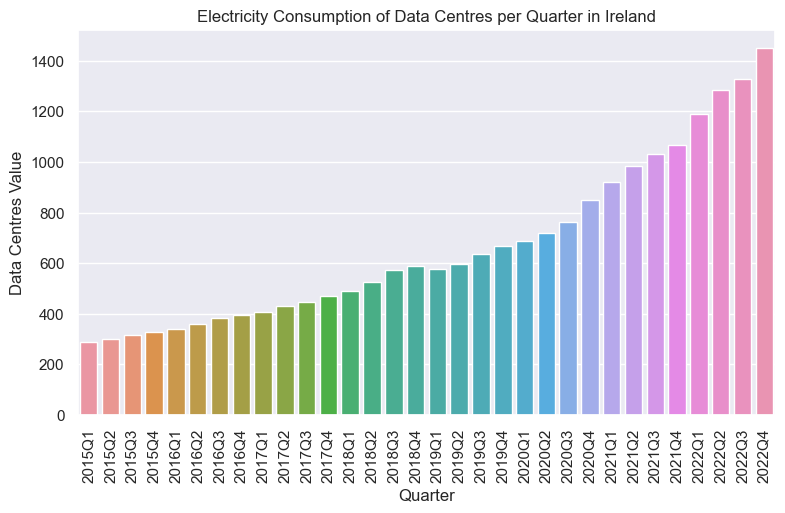

In [29]:
plt.figure(figsize=(9,5)) 
ax = sns.barplot(x="Quarter",y="Data Centres Value",data=Data_Centers,estimator=np.mean) # confidende
#ax.set_xticklabels(rotation=90);
ax.tick_params(axis='x', labelrotation=90)
ax.set(title='Electricity Consumption of Data Centres per Quarter in Ireland');


**Discussion:** The crisis in the energy sector became global after the crisis due to Ukraine war in January 2022. However, the data centres increased their energy consumption increased by 31% between winter 2021 and 2022 despite the crisis due to the rise in the electricity prices.


It can be noted the difference between the 215 gigawatts on the first quarter of 2015 in contrast to the last quarter of 2022 with € 1450 gigawatts per hour, which represents an increase of 400 %

The fluctuation changes from 5% during the quartes of 2015, to a 12% in 2021 ending in 2022 with a 18% of the total consumption of electricity demand in the ICT sector in Ireland.


In [30]:
#plt.figure(figsize=(9,5)) 
#ax = sns.barplot(x="Quarter",y="Customers other than Data Centers Value",data=Data_Centers,estimator=np.mean) # confidende
#ax.set_xticklabels(rotation=90);
#ax.tick_params(axis='x', labelrotation=90)
#ax.set(title='Electricity Consumption of Customers other than Data Centres per Quarter');

## 1.2. Correlation of the variables

In [31]:
# Checking the correlation between variables
correlation = Data_Centres_new.corr()
print(correlation)

                                         Data Centres Value  \
Data Centres Value                                 1.000000   
Customers other than Data Centers Value            0.062107   
All Metered Customers                              0.705862   

                                         Customers other than Data Centers Value  \
Data Centres Value                                                      0.062107   
Customers other than Data Centers Value                                 1.000000   
All Metered Customers                                                   0.750821   

                                         All Metered Customers  
Data Centres Value                                    0.705862  
Customers other than Data Centers Value               0.750821  
All Metered Customers                                 1.000000  


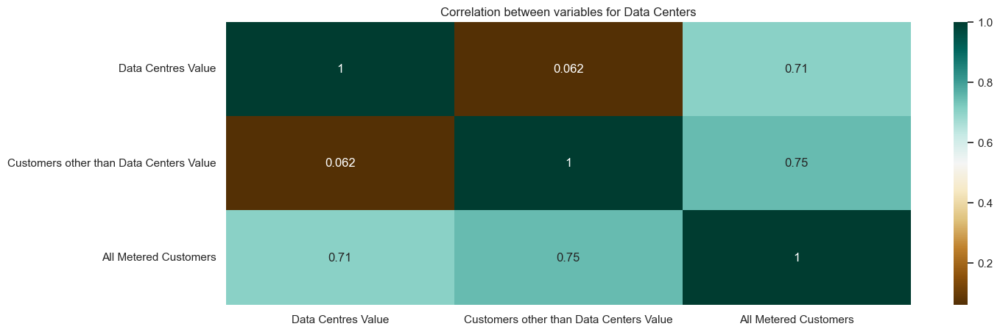

In [32]:
# Finding the relations between the variables through a heat map
plt.figure(figsize=(15,5)) 
c= Data_Centres_new.corr() 
sns.heatmap(c,cmap="BrBG",annot=True) 
plt.title("Correlation between variables for Data Centers");
#there is a weak correlation of 0.062 Data Centres and Other customers than Data Centres

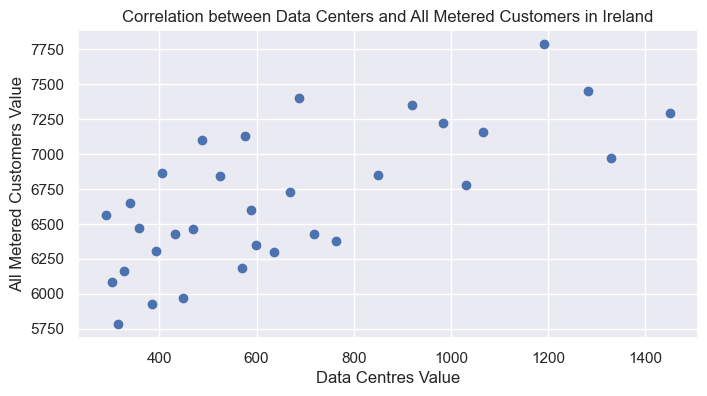

In [33]:
#Ploting a scatter plot to stablish if there is any correlation between two variables

#sns.set_palette('rainbow')# Plot
#sns.set_context('talk')# Plot
#sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(8,4)) 
ax.scatter(Data_Centres_new['Data Centres Value'], Data_Centres_new['All Metered Customers']) 
ax.set_xlabel('Data Centres Value') 
ax.set_ylabel('All Metered Customers Value') 
plt.title("Correlation between Data Centers and All Metered Customers in Ireland");
plt.show() 

In [34]:
#fig, ax = plt.subplots(figsize=(7,4)) 
#sns.set_palette('rainbow')#
#sns.scatterplot(data = Data_Centres_new, x = 'Data Centres Value', y = 'All Metered Customers')
#plt.title("Correlation between Data Centers and All Metered Customers in Ireland");
#plt.show() 

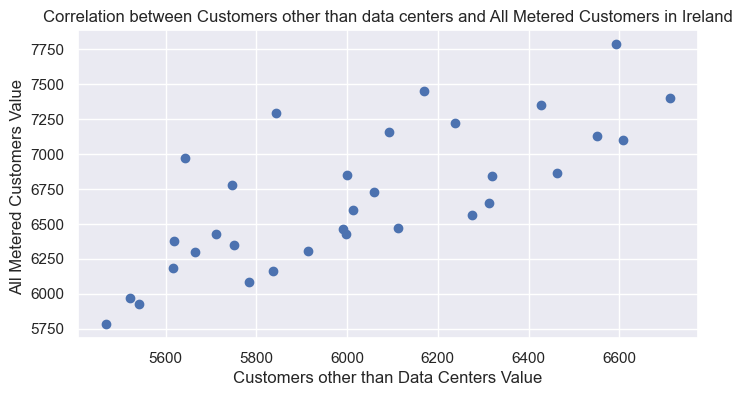

In [35]:
#Ploting a scatter plot to stablish if there is any correlation between two variables

fig, ax = plt.subplots(figsize=(8,4)) 
ax.scatter(Data_Centres_new['Customers other than Data Centers Value'], Data_Centres_new['All Metered Customers']) 
ax.set_xlabel('Customers other than Data Centers Value') 
ax.set_ylabel('All Metered Customers Value ') 
plt.title("Correlation between Customers other than data centers and All Metered Customers in Ireland");
plt.show() 

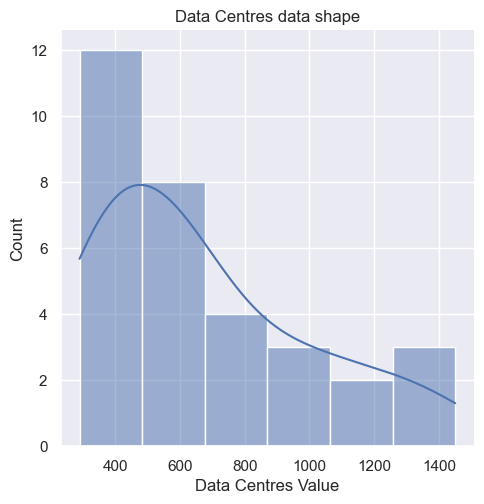

In [36]:
# Visualizing the Data Centres variable
# It can be seen that data is positive skewed in this feature.
sns.set(rc={"figure.figsize":(4, 6)})
sns.displot(data=Data_Centres_new, x="Data Centres Value", kde=True);  # color='blue'
plt.title("Data Centres data shape");

## 1.3. Outliers Detection.

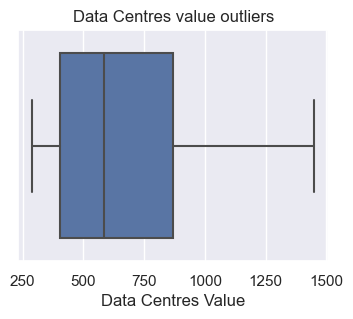

In [37]:
# Detecting Outliers
# As it can be seen below, there are no ouliers in three of the numeric variables of my dataset.
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Data_Centres_new['Data Centres Value']); # color='maroon'
plt.title("Data Centres value outliers");

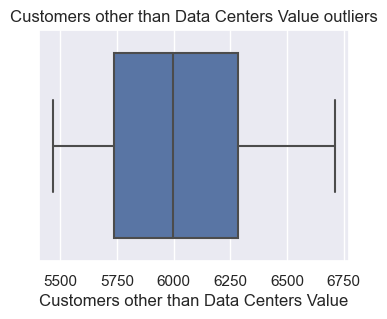

In [38]:
# Detecting Outliers on Customers other than Data Centers
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Data_Centres_new['Customers other than Data Centers Value']); # color='orange'
plt.title("Customers other than Data Centers Value outliers");

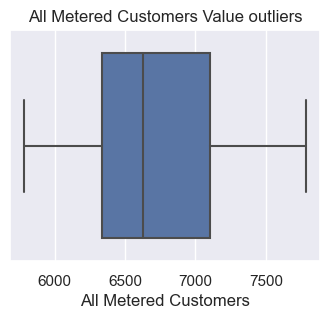

In [39]:
# Detecting Outliers on all metered customers
# As it can be seen below, there are no ouliers 
sns.set(rc={"figure.figsize":(4, 3)})
sns.boxplot(x=Data_Centres_new['All Metered Customers']); # color='brown'
plt.title("All Metered Customers Value outliers");

# 2. Machine learning section 

## 2.1. Data Preparation

In [40]:
# split into X and y
#X = Data_Centers.loc[:, ['Quarter', 'Customers other than Data Centers Value']] # independent variables

#y = Data_Centers['Data Centres Value']# dependent variables

In [41]:
#X

In [42]:
# Convert variable "Quarter" from object type into an interger 
Data_Centres_new['Quarter'] = Data_Centres_new['Quarter'].astype(str).str.replace('Q', '').astype(int)
Data_Centres_new.head()

,Quarter,Data Centres Value,Customers other than Data Centers Value,All Metered Customers
0,20151,290,6275,6565
1,20152,302,5784,6086
2,20153,315,5468,5783
3,20154,328,5837,6165
4,20161,339,6312,6651


In [43]:
#Data_Centres_new.head()

In [44]:
# split into X and y
X = Data_Centres_new.loc[:, ['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']] # independent variables

y = Data_Centres_new['Data Centres Value']# dependent variables

In [45]:
#defining X and y
#X = Data_Centres_new.iloc[:, [0,2,3]].values
#y = Data_Centres_new.iloc[:, 1].values

In [46]:
#X

In [47]:
#y

## 2.2. Checking scaling feature engineer before and Experimentation ML Models

To verify that scaling process has not changed the shape of the data

In [48]:
#checking the efect of scale in the data
#from sklearn.preprocessing import scale
#Data_Centres_new['Data Centres Value'] = scale(Data_Centres_new['Data Centres Value'])

In [49]:
#Feature scaling to check if data shape has not been changed
from sklearn.preprocessing import StandardScaler
Data_Centres_new["standardized"]=StandardScaler().fit_transform(Data_Centres_new[["Data Centres Value"]])                                                        

In [50]:
#Checking same variable Non Residential Value with Mix Max scaler
import sklearn.preprocessing as preproc
Data_Centres_new["minmax_Data Centres Value"]=preproc.minmax_scale(Data_Centres_new["Data Centres Value"])

In [51]:
#checking Non Residential value variable when log transformation is being applied
from sklearn.preprocessing import FunctionTransformer
import numpy as np

Data_Centres_new['log_Data Centres Value'] = np.log10(Data_Centres_new['Data Centres Value'] + 1)

In [52]:
import sklearn.preprocessing as preproc
Data_Centres_new["l2_normalized"]= preproc.normalize(Data_Centres_new[["Data Centres Value"]], axis=0)

Text(39.0, 0.5, 'Data Centres Value')

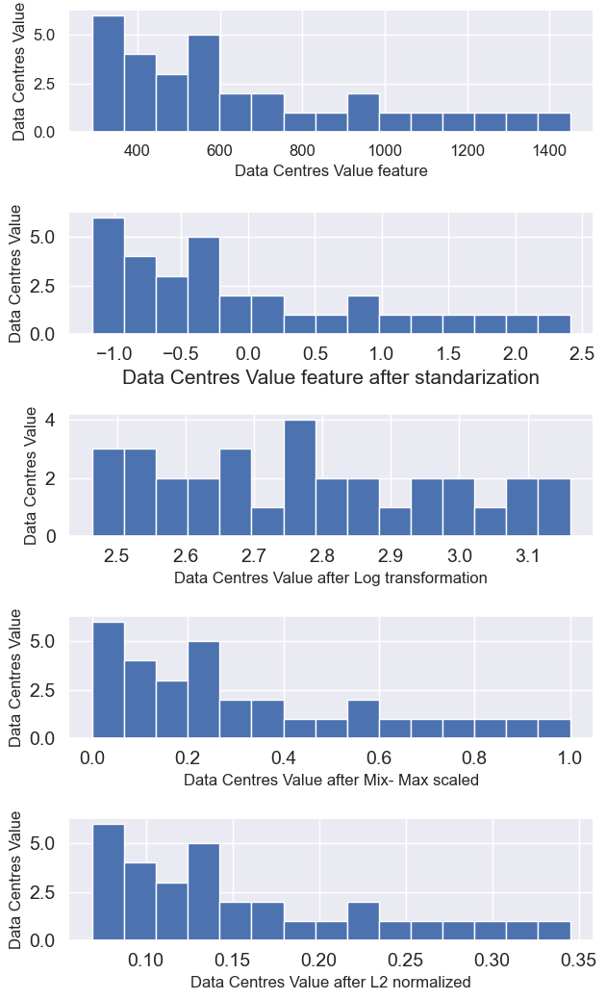

In [53]:
# Verifying Non Residential Value variable before and after the three feaure scaling techniques. 
# to check whether the shape of the data has changed or not 

from matplotlib import pyplot as plt
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5,1,figsize=(7, 11))#14
fig.tight_layout(pad=3.0)

Data_Centres_new['Data Centres Value'].hist(ax=ax1, bins=15)
ax1.tick_params(labelsize=12)
ax1.set_xlabel('Data Centres Value feature', fontsize=12)
ax1.set_ylabel('Data Centres Value', fontsize=12)

Data_Centres_new['standardized'].hist(ax=ax2, bins=15)
ax2.tick_params(labelsize=14)
ax2.set_xlabel('Data Centres Value feature after standarization', fontsize=15)
ax2.set_ylabel('Data Centres Value', fontsize=12) 

Data_Centres_new['log_Data Centres Value'].hist(ax=ax3, bins=15)
ax3.tick_params(labelsize=14)
ax3.set_xlabel('Data Centres Value after Log transformation', fontsize=12)
ax3.set_ylabel('Data Centres Value', fontsize=12) 

Data_Centres_new['minmax_Data Centres Value'].hist(ax=ax4, bins=15)
ax4.tick_params(labelsize=14)
ax4.set_xlabel('Data Centres Value after Mix- Max scaled', fontsize=12)
ax4.set_ylabel('Data Centres Value', fontsize=12) 

Data_Centres_new['l2_normalized'].hist(ax=ax5, bins=15)
ax5.tick_params(labelsize=14)
ax5.set_xlabel('Data Centres Value after L2 normalized', fontsize=12)
ax5.set_ylabel('Data Centres Value', fontsize=12) 


# 3. Experimentation Section.


## 3.1. Experiment 1 - Model Linear Regression with no cross validation

Trying first time with all the features, including the ones that are highly correlated and scale feature engineering technique.

In [54]:
#defining X and y
# split into X and y
X = Data_Centres_new.loc[:, ['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']] # independent variables

y = Data_Centres_new['Data Centres Value']# dependent variables

In [55]:
X.shape

(32, 3)

In [56]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are lost after 
# scaling (the df is converted to a numpy array)
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

Index(['Quarter', 'Customers other than Data Centers Value',
       'All Metered Customers'],
      dtype='object')

In [57]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

In [58]:
#X_test

## 3.2. Using Recursive Feature Elimination (RFE)
Now, there are 3 predictor features. To build the model using RFE, to tell how many features are needed in final model. It then runs a feature elimination algorithm. The number used for the number of features to be used in the model is a hyperparameter.

In [59]:
# num of max features
len(X_train.columns)

3

In [60]:
# first model with an arbitrary choice of n_features
# running RFE with number of features=3

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=3)             
rfe = rfe.fit(X_train, y_train)

In [61]:
# tuples of (feature name, whether selected, ranking)
# note that the 'rank' is > 1 for non-selected features
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Quarter', True, 1),
 ('Customers other than Data Centers Value', True, 1),
 ('All Metered Customers', True, 1)]

In [62]:
# predict prices of X_test
y_pred = rfe.predict(X_test)

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999982698528266


In [63]:
# try with another value of RFE
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=2)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = rfe.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999983109124607


## 3.3. Cross-Validation in sklearn

In [64]:
# k-fold CV (using all the 3 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores)) 

[0.99999994 0.99999254 1.         0.99999857 0.99999821]
Avg : 0.999997850779075


## 3.4. Hyperparameter Tuning Using Grid Search Cross-Validation

In [65]:
# number of features in X_train
len(X_train.columns)


3

In [66]:
# step-1: create a cross-validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 50)

# step-2: specify range of hyperparameters to tune
hyper_params = [{'n_features_to_select': list(range(1, 4))}] # 3 features


# step-3: perform grid search
# 3.1 specify model
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm)             

# 3.2 call GridSearchCV()
model_cv = GridSearchCV(estimator = rfe, 
                        param_grid = hyper_params, 
                        scoring= 'r2', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(X_train, y_train) 

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=50, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid=[{'n_features_to_select': [1, 2, 3]}],
             return_train_score=True, scoring='r2', verbose=1)

In [67]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.003295,0.000734,0.001444,0.000495,1,{'n_features_to_select': 1},-1.535590,0.617282,-0.430889,-4.701334,...,-1.084290,1.977099,3,0.500939,0.368266,0.404275,0.504483,0.345402,0.424673,6.643496e-02
1,0.002225,0.000129,0.001076,0.000028,2,{'n_features_to_select': 2},0.999999,0.999998,0.999967,1.000000,...,0.999993,0.000013,1,0.999998,0.999999,1.000000,0.999999,0.999999,0.999999,6.485554e-07
2,0.001568,0.000503,0.001090,0.000007,3,{'n_features_to_select': 3},0.999998,0.999998,0.999967,1.000000,...,0.999993,0.000013,2,0.999998,0.999999,1.000000,0.999999,0.999999,0.999999,6.508528e-07


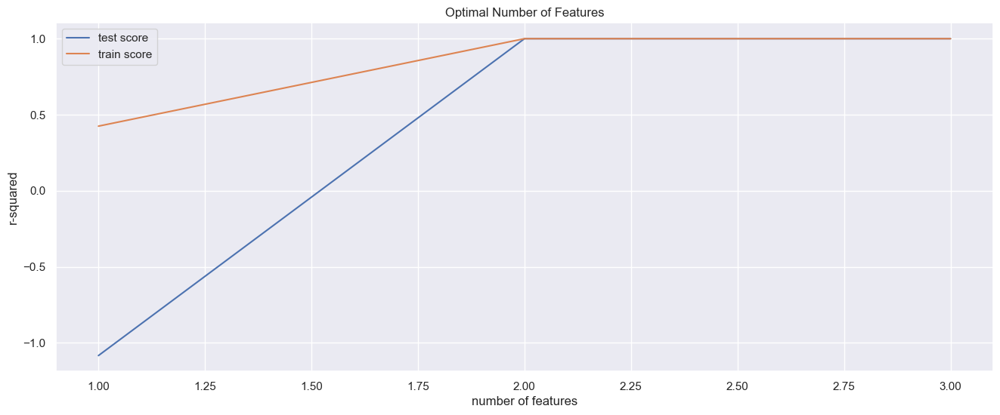

In [68]:
# plotting cv results
plt.figure(figsize=(16,6))

plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_test_score"])
plt.plot(cv_results["param_n_features_to_select"], cv_results["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [69]:
# final model
n_features_optimal = 2

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, n_features_to_select=n_features_optimal)             
rfe = rfe.fit(X_train, y_train)

# predict prices of X_test
y_pred = lm.predict(X_test)
r2 = sklearn.metrics.r2_score(y_test, y_pred)
print(r2)

0.9999982698528266


In [70]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lm.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lm.score(X_test, y_test)))  #0.90, 089

Training set score: 1.00
Test set score: 1.00


In [71]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.1, 0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [72]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 1.00
Test set score: 1.00


In [73]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [0.1, 0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [74]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))#0.98
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))#0.96

Training set score: 1.00
Test set score: 1.00


# 3.5. Creating linear Model removing one variable.

All Meteres customers feature is going to be removes as is highly correlated with the target variable.

In [75]:
# Import train_test_split function
X=Data_Centres_new[['Quarter', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Dependent variable

In [76]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are lost after 
# scaling (the df is converted to a numpy array)
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

In [77]:
lm = LinearRegression()
lm.fit(X_train, y_train)

#y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)  #making predictions

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred_test)
print(r2)

0.9073116069002364


In [78]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lm.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lm.score(X_test, y_test)))  #0.90, 089

Training set score: 0.89
Test set score: 0.91


In [79]:
# k-fold CV (using all the 2 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[ 0.94083915  0.6316076  -0.23422283  0.81695551  0.90910924]
Avg : 0.6128577345537252


# 3.6. Ridge and Lasso Regression to improve the model

### 3.6.1. Ridge Regression 

In [80]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.1, 0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [81]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.89
Test set score: 0.91


### 3.6.2. Lasso Regression 

In [82]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [83]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))#0.98
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))#0.96

Training set score: 0.89
Test set score: 0.91


### Trying Mix Max scaler

In [84]:
# Import train_test_split function
X=Data_Centres_new[['Quarter', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Labels

In [85]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

In [86]:
from sklearn.preprocessing import MinMaxScaler # values between 0 and 1
scaler = MinMaxScaler()

X_train = scaler.fit_transform(X_train)
#Y.reshape(-1,1)
X_test = scaler.fit_transform(X_test)

In [87]:
#X_train

In [88]:
lm = LinearRegression()
lm.fit(X_train, y_train)

#y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)  #making predictions

# evaluate the model on test set
r2 = sklearn.metrics.r2_score(y_test, y_pred_test)
print(r2)

0.8965053571244533


In [89]:
# k-fold CV (using all the 2 variables)
lm = LinearRegression()
scores = cross_val_score(lm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[ 0.94083915  0.6316076  -0.23422283  0.81695551  0.90910924]
Avg : 0.6128577345537595


### Ridge Regression

In [90]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.1, 0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [91]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.89
Test set score: 0.91


### Lasso Regression

In [92]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [0.1, 0.01] # 0.01, 0.1, 1  
                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [93]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lasso.score(X_train, y_train)))#0.98
print("Test set score: {:.2f}".format(lasso.score(X_test, y_test)))#0.96

Training set score: 0.89
Test set score: 0.90


## 3.7. Experiment  - Ensembling learning with Random Forest Regressor and Gradient Boosting Regressor

This experiment will be tested with Decision Tree Regressor, Gradient Boosting Regressor and Random Forest Regressor with all features.

### 3.7.1. Decision Tree Regressor

In [94]:
# Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']]  # all features
y=Data_Centres_new['Data Centres Value']  # target value

In [95]:
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

#Create a Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [96]:
y_pred_DT = DTregressor.predict(X_test)

In [97]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 0.9080, 0.9362

0.9278819360536856

### 3.7.2. Gradient Boosting Regressor

In [98]:
# Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']]  # all features
y=Data_Centres_new['Data Centres Value']  # target value

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

#Create a Gradients Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, learning_rate=0.2, max_depth=3)

model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(learning_rate=0.2)

In [99]:
y_gradient_pred = model.predict(X_test)

In [100]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9649

0.9685985036633953

### 3.7.3. Create a Random Forest Regressor

All features are going to be included to check the R2 score before doing the feature important analysis.

In [101]:
# Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']]  # all features
y=Data_Centres_new['Data Centres Value']  # target value

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

# Create a Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=48)

# Train the model using the training sets y_pred_random=regressor.predict(X_test)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=48)

In [102]:
y_pred_random = rf.predict(X_test)

In [103]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_random) ## 0.9366

0.9366206653607378

### 3.7.4. Finding Important Features in Scikit-learn

In [104]:
#Use the feature importance variable to see feature importance scores.
import pandas as pd
feature_imp = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_imp

Quarter                                    0.949996
All Metered Customers                      0.042014
Customers other than Data Centers Value    0.007990
dtype: float64

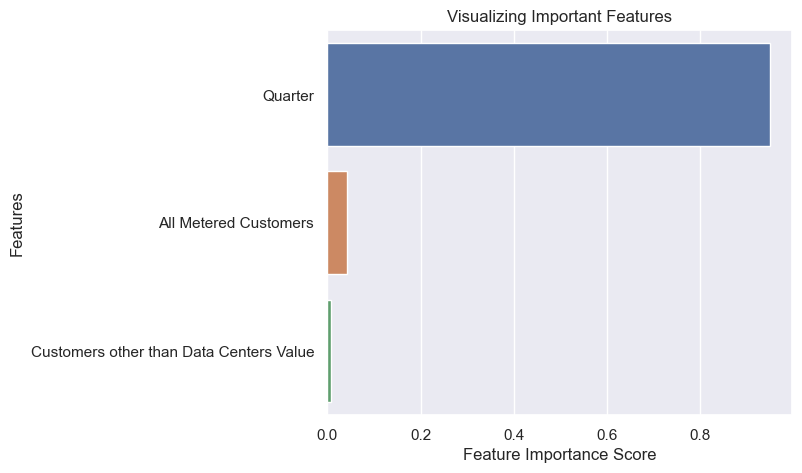

In [105]:
#Visualize the feature importance. 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.figure(figsize=(6,5)) 
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
#plt.legend()
plt.show()

## 3.8. Generating the Model on Selected Features

We can remove the "All Metered Customers" feature because it has very low importance, and select the 2 remaining features.

### 3.8.1. Random forest Regressor

In [106]:
# Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'All Metered Customers']]  # Removing 'Customers other than Data Centers Values' Feature
y=Data_Centres_new['Data Centres Value']  # Labels

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

#Create Random forest Regressor
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=100, random_state=48)

# Train the model using the training sets y_pred_random=regressor.predict(X_test)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=48)

In [107]:
y_pred_r = rf.predict(X_test)

In [108]:
#Accuracy of Random Regression model after removing "All Metered Customer" feature
 
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_r) ## 0.9459

0.9459890791063512

In [109]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(rf.score(X_train, y_train)))
print("Test set score: {:.2f}".format(rf.score(X_test, y_test)))  

Training set score: 0.99
Test set score: 0.95


In [110]:
# K-fold CV 
rf = RandomForestRegressor(n_estimators=100, random_state=48)
scores = cross_val_score(rf, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.9488943  0.94858353 0.8430247  0.91044887 0.93305313]
Avg : 0.9168009067725104


**Discussion:** After the feature importance analysis, it is clear that Random Forest Regressor Model improves accurary when removing one of the variables with less importance producing an R2 score of **0.94**

### 3.8.2. Decision Tree Regressor

In [111]:
#Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Labels

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

#Create a Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 5)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5)

In [112]:
y_pred_DT = DTregressor.predict(X_test)

In [113]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 0.9362

0.9371107608674731

In [114]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(DTregressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(DTregressor.score(X_test, y_test)))  #1.00 # 0.99

Training set score: 1.00
Test set score: 0.94


In [115]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
from statsmodels.tools.eval_measures import mse, rmse
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.9986
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.8659
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))#43.53
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))#18.17

R-squared of the model in training set is: 0.9998170490338074
-----Test set statistics-----
R-squared of the model in test set is: 0.9371107608674731
Root mean squared error of the prediction is: 77.46980978788723
Mean absolute percentage error of the prediction is: 8.051488751933961


In [116]:
# K-fold CV 
DTregressor = DecisionTreeRegressor(max_depth = 5)
scores = cross_val_score(DTregressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.95778151 0.71489481 0.67117293 0.93665666 0.89831374]
Avg : 0.8357639291309811


### 3.8.3. Gradient Boosting Regressor

In [117]:
#Select X and Y
X=Data_Centres_new.loc[:,['Quarter', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Labels

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

#Create a Gradients Boosting Regressor
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=100, learning_rate=0.2, max_depth=3)

model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(learning_rate=0.2)

In [118]:
y_gradient_pred = model.predict(X_test)

In [119]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9569

0.9570295304537473

In [120]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(model.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(model.score(X_test, y_test)))
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_gradient_pred)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_gradient_pred) / y_test)) * 100))

R-squared of the model in training set is: 0.9999999999541432
-----Test set statistics-----
R-squared of the model in test set is: 0.9570295304537473
Root mean squared error of the prediction is: 64.0367627752467
Mean absolute percentage error of the prediction is: 6.554253939399081


In [121]:
# K-fold CV 
model= GradientBoostingRegressor(n_estimators=100, 
    learning_rate=0.2, 
    max_depth=3
)
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.87826216 0.96160746 0.91842825 0.96487862 0.89972781]
Avg : 0.9245808598185633


**Discussion:** After removing the less important feature, the R2 score for Decision Tree is reduced to **0.9385** and increased to **0.9616** for Gradient Boosting Regressor.

## 3.9. Experiment - Support Vector Regressor.

### 3.9.1. SVR Model with all features

In [122]:
# Select X and y
X=Data_Centres_new.loc[:,['Quarter', 'Customers other than Data Centers Value', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Labels

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

In [123]:
# Training the SVR model on the Training set
from sklearn.svm import SVR
regressor = SVR(kernel='linear')# degree=3, gamma='scale')  #(kernel = 'rbf')  
regressor.fit(X_train, y_train)

SVR(kernel='linear')

In [124]:
#Evaluation of the model
y_pred_svr = regressor.predict(X_test)

#Accuracy of the SVR model
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_svr)  

0.9949587609913768

In [125]:
#Display the r2 score values on training and test set
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test))) 

Training set score: 0.99
Test set score: 0.99


### 3.9.2. SVR Model removing one feature

In [126]:
# Select X and y
X=Data_Centres_new.loc[:,['Quarter', 'All Metered Customers']]  # Features
y=Data_Centres_new['Data Centres Value']  # Labels

# performing preprocessing part
from sklearn.preprocessing import StandardScaler
# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc_X = StandardScaler()
sc_y = StandardScaler()

# Train the model by calling a method fit_transform()
X = sc_X.fit_transform(X)
y = sc_y.fit_transform(pd.DataFrame(y))

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25) #25 ideal

In [127]:
# Training the SVR model on the Training set
from sklearn.svm import SVR
regressor = SVR(kernel='linear')# degree=3, gamma='scale')  #(kernel = 'rbf')  
regressor.fit(X_train, y_train)

SVR(kernel='linear')

In [128]:
#Evaluation of the model
y_pred_svr = regressor.predict(X_test)

#Accuracy of the SVR model
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_svr)  

0.8686190369609026

In [129]:
#Display the r2 score values on training and test set
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test))) 

Training set score: 0.86
Test set score: 0.87


In [130]:
# K-fold CV 
regressor = SVR(kernel='linear')
scores = cross_val_score(regressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.87672744 0.66656713 0.040378   0.75467327 0.71189141]
Avg : 0.6100474486128988


**Discussion:** After evaluationg SVR with all features yield a score of **0.99**. In contrast, when removing the feature 'Customers other than Data Centers Value', the R2 score improves to **0.87** in the test set. However, standardization was performed for X and y variables.

## 3.10. Experiment with Polynomial Features

It will be applied reggresion to only two features: Target value "Data Centres value" and "All metered customers" using Mix Max scaling.

In [131]:
# Select X and y
df=Data_Centres_new.loc[:,['Data Centres Value', 'All Metered Customers']]  # Features
#df.head()

In [132]:
# recaling the variables (both)
from sklearn.preprocessing import MinMaxScaler
df_columns = df.columns
scaler = MinMaxScaler()
df = scaler.fit_transform(df)

# rename columns (since now its an np array)
df = pd.DataFrame(df)
df.columns = df_columns
#df.head()

In [133]:
# visualise area-price relationship
#sns.regplot(x="Data Centres Value", y="All Metered Customers", data=df, fit_reg=False)

In [134]:
# split into train and test
df_train, df_test = train_test_split(df, 
                                     train_size = 0.8, 
                                     test_size = 0.2, 
                                     random_state = 25)
print(len(df_train))
print(len(df_test))

25
7


In [135]:
# split into X and y for both train and test sets
# reshaping is required since sklearn requires the data to be in shape
# (n, 1), not as a series of shape (n, )
X_train = df_train['All Metered Customers']
X_train = X_train.values.reshape(-1, 1)
y_train = df_train['Data Centres Value']

X_test = df_test['All Metered Customers']
X_test = X_test.values.reshape(-1, 1)
y_test = df_test['Data Centres Value']

In [136]:
# fit multiple polynomial features
degrees = [1, 2, 3, 6]

# initialise y_train_pred and y_test_pred matrices to store the train and test predictions
# each row is a data point, each column a prediction using a polynomial of some degree
y_train_pred = np.zeros((len(X_train), len(degrees)))
y_test_pred = np.zeros((len(X_test), len(degrees)))

for i, degree in enumerate(degrees):
    
    # make pipeline: create features, then feed them to linear_reg model
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
    model.fit(X_train, y_train)
    
    # predict on test and train data
    # store the predictions of each degree in the corresponding column
    y_train_pred[:, i] = model.predict(X_train)
    y_test_pred[:, i] = model.predict(X_test)

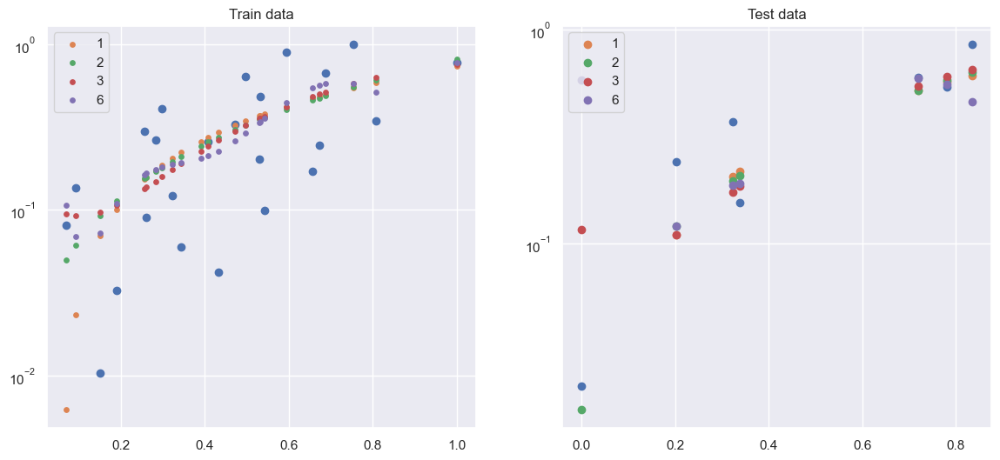

In [137]:
# visualise train and test predictions
# note that the y axis is on a log scale

plt.figure(figsize=(14, 6))

# train data
plt.subplot(121)
plt.scatter(X_train, y_train)
plt.yscale('log')
plt.title("Train data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_train, y_train_pred[:, i], s=15, label=str(degree))
    plt.legend(loc='upper left')
    
# test data
plt.subplot(122)
plt.scatter(X_test, y_test)
plt.yscale('log')
plt.title("Test data")
for i, degree in enumerate(degrees):    
    plt.scatter(X_test, y_test_pred[:, i], label=str(degree))
    plt.legend(loc='upper left')

In [138]:
# compare r2 for train and test sets (for all polynomial fits)
print("R-squared values: \n")

for i, degree in enumerate(degrees):
    train_r2 = round(sklearn.metrics.r2_score(y_train, y_train_pred[:, i]), 2)
    test_r2 = round(sklearn.metrics.r2_score(y_test, y_test_pred[:, i]), 2)
    print("Polynomial degree {0}: train score={1}, test score={2}".format(degree, 
                                                                         train_r2, 
                                                                         test_r2))

R-squared values: 

Polynomial degree 1: train score=0.42, test score=0.76
Polynomial degree 2: train score=0.42, test score=0.79
Polynomial degree 3: train score=0.43, test score=0.77
Polynomial degree 6: train score=0.45, test score=-0.05


**Discussion:** The results produced by this experiment proves that adding polynomial features will not be beneficial for the lienar data at hand. 

## 4. Final Model Building after Experimentation

In [139]:
#pip install lime

In [140]:
#defining X and y
#X = Data_Centres_new.loc[:, ['Quarter', 'All Metered Customers']] # independent variables
#y = Data_Centres_new['Data Centres Value']# dependent variables

In [141]:
X = Data_Centres_new.iloc[:, [0,3]].values
y = Data_Centres_new.iloc[:, 1].values

import numpy as np
X = np.array(X)

# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state =0) 

In [142]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((25, 2), (7, 2), (25,), (7,))

### 4.1. Feature Scaling techique.

As shown above, scaling, mix-max and standarization methods were tested and standarization yield better results for all the regressors models below after the experimentation section. 

In [143]:
#from sklearn.preprocessing import MinMaxScaler # values between 0 and 1
#scaler = MinMaxScaler()

#X_train = scaler.fit_transform(X_train)
#Y.reshape(-1,1)
#X_test = scaler.fit_transform(X_test)

In [144]:
# performing preprocessing part
from sklearn.preprocessing import StandardScaler

# Create and initialise an object (sc) by calling a method named as StandardScaler()
sc = StandardScaler()

# Train the model by calling a method fit_transform()
X_train = sc.fit_transform(X_train)

# Transform the data into standised form
X_test = sc.transform(X_test)

In [145]:
X_test

array([[-0.59811897, -0.63564863],
       [ 0.6338022 , -0.82373818],
       [-0.64059901, -1.79239936],
       [-1.49019982, -2.22970756],
       [ 0.12404172,  0.93254798],
       [-0.2157986 , -1.27985534],
       [ 1.39844293,  2.47488229]])

In [146]:
#import numpy as np
#X = np.array(X)

In [147]:
# scaling the features
#import numpy as np
#from sklearn.preprocessing import scale

# storing column names in cols, since column names are lost after 
# scaling (the df is converted to a numpy array)
#X = X.columns
#cols = X
#X = pd.DataFrame(scale(X))
#X = cols
#X

In [148]:
# Convert X to numpy array 
#import numpy as np
#X = np.array(X)

In [149]:
#X

### 4.2. Decision Tree Regressor

In [150]:
from sklearn.tree import DecisionTreeRegressor
DTregressor = DecisionTreeRegressor(max_depth = 3)
DTregressor.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3)

In [151]:
y_pred_DT = DTregressor.predict(X_test)

In [152]:
#Accuracy of the model for DTR
from sklearn.metrics import r2_score
r2_score(y_test, y_pred_DT) # 0.9520

0.9520292038438282

In [153]:
print("R-squared of the model in training set is: {}".format(DTregressor.score(X_train, y_train)))#0.99981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(DTregressor.score(X_test, y_test)))#0.9656
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_DT)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_DT) / y_test)) * 100))

R-squared of the model in training set is: 0.991608768266443
-----Test set statistics-----
R-squared of the model in test set is: 0.9520292038438282
Root mean squared error of the prediction is: 58.29751042902451
Mean absolute percentage error of the prediction is: 5.898024537887025


In [154]:
# Printing the predicted values and actual values
results = np.concatenate((y_pred_DT.reshape(len(y_pred_DT),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   420.600000   470.0
1   677.750000   763.0
2   420.600000   448.0
3   323.600000   315.0
4   570.333333   576.0
5   570.333333   571.0
6  1306.000000  1191.0


In [155]:
feature_names=['Quarter','All Metered Customers']
class_nanmes =['Data Centres Value']

In [156]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=['Quarter','All Metered Customers'], class_names=['Data Centres Value'], verbose=True, mode='regression')

### 4.2.1. Lime Interpretation - DTR

In [157]:
i = 2
exp = explainer.explain_instance(X_test[i], DTregressor.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 733.7247971834039
Prediction_local [477.52995237]
Right: 420.6


[('-1.02 < Quarter <= 0.17', -247.99107104060653),
 ('All Metered Customers <= -0.71', -8.20377377063484)]

**Discussion**
- The predicted value of the Data Centres value is 420.60.

- The variable Quarter 2 has a negative influence in the prediction. In contrast, All Metered Customers has a positive influence.  

- All the values are in gigawatts per hour

In [158]:
#pip install pydotplus

In [159]:
#pip install graphviz

### 4.2.2. Decision Tree Regressor Visualization

In [160]:
# Ploting a decision tree
#feature_names=['Data Centres Value']
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn import tree

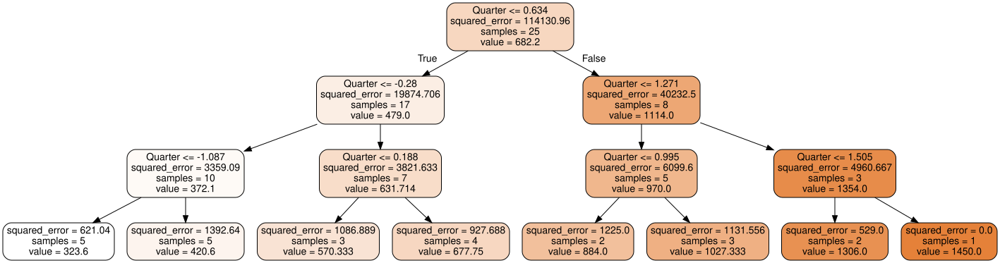

In [161]:
#Plotting the Decision Tree Regressor
feature_names=['Quarter','All Metered Customers']
class_names = Data_Centres_new['Data Centres Value']
#
dot_data = tree.export_graphviz(DTregressor, out_file=None, 
                                feature_names=['Quarter', 'All Metered Customers'], class_names = Data_Centres_new['Data Centres Value'], # X.columns
                                filled=True, rounded=True)
graphviz.Source(dot_data, format="png") 

### 4.2.3. Cross Validation - K-Fold Validation

In [162]:
# k-fold CV 
DTregressor = DecisionTreeRegressor(max_depth = 3)
scores = cross_val_score(DTregressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.80605822 0.91643472 0.97517159 0.94493772 0.91387231]
Avg : 0.9112949139666762


In [163]:
# Method or Function for Linear Regression plot
def lin_regplot(X, y, model):
    plt.scatter(X, y, c = 'blue')
    plt.plot(X, model.predict(X), color = 'red', linewidth = 2)    
    return

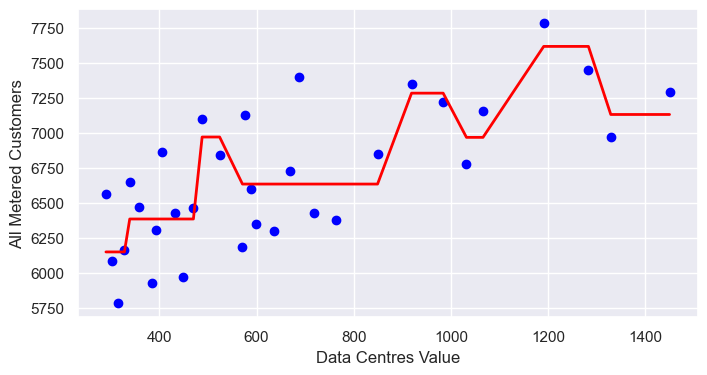

In [164]:
# import DecisionTreeRegressor from the sklearn library
from sklearn.tree import DecisionTreeRegressor

# Store the feature or attribute values in X and y
X = Data_Centres_new[['Data Centres Value']].values
y = Data_Centres_new[['All Metered Customers']].values

# Initialise an object by calling a method DecisionTreeRegressor()
tree = DecisionTreeRegressor(max_depth = 3)
tree.fit(X, y)

# Return a copy of the array collapsed into one dimension.
fig, ax = plt.subplots(figsize=(8,4)) 
sort_idx = X.flatten().argsort()

lin_regplot(X[sort_idx], y[sort_idx], tree)
plt.xlabel('Data Centres Value')
plt.ylabel('All Metered Customers')
# plt.savefig('./figures/tree_regression.png', dpi = 300)
plt.show()

### 4.3. Random Forest Regressor

In [165]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 50, random_state = 2)
regressor.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50, random_state=2)

In [166]:
y_pred_random = regressor.predict(X_test)

In [167]:
#Accuracy of Random Regression model

from sklearn.metrics import r2_score
r2_score(y_test, y_pred_random) ## 0.9605

0.963227115761529

In [168]:
print("R-squared of the model in training set is: {}".format(regressor.score(X_train, y_train)))#0.9928
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(regressor.score(X_test, y_test)))#0.9490
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_pred_random)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_pred_random) / y_test)) * 100))

R-squared of the model in training set is: 0.9913968262424149
-----Test set statistics-----
R-squared of the model in test set is: 0.963227115761529
Root mean squared error of the prediction is: 51.04173082600434
Mean absolute percentage error of the prediction is: 6.203497641136945


In [169]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(regressor.score(X_train, y_train)))
print("Test set score: {:.2f}".format(regressor.score(X_test, y_test)))  #0.99, 0.95

Training set score: 0.99
Test set score: 0.96


In [170]:
# Printing the predicted values and actual values
results = np.concatenate((y_pred_random.reshape(len(y_pred_random),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

   Predicted  Actual
0     432.58   470.0
1     732.84   763.0
2     428.94   448.0
3     312.24   315.0
4     649.40   576.0
5     538.98   571.0
6    1286.62  1191.0


In [171]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=['Data Centres Value'], verbose=True, mode='regression')

### 4.3.1. Lime Interpretation RFR

In [172]:
i = 2
exp = explainer.explain_instance(X_test[i], regressor.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 731.9265720094317
Prediction_local [493.41161474]
Right: 428.94


[('-1.02 < Quarter <= 0.17', -209.1923082279545),
 ('All Metered Customers <= -0.71', -29.32264904368528)]

**Discussion**

-The predicted value of the Data Centres value is 428.94.

-The variable Quarter and All metered customers features are impacting in a negative way to the prediction of the target value.

-All the values are in gigawatts per hour.

### 4.3.2. Cross Validation K-Fold CV - RFR

In [173]:
# K-fold CV 
regressor = RandomForestRegressor(n_estimators = 50, random_state = 2)
scores = cross_val_score(regressor, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.76915687 0.93711209 0.9477608  0.98486133 0.97462983]
Avg : 0.9227041851518629


### 4.4. Gradient Boosting Regressor

In [174]:
from sklearn.ensemble import GradientBoostingRegressor
model= GradientBoostingRegressor(n_estimators=25, 
    learning_rate=0.1, 
    max_depth=2
)
model.fit(X_train, y_train)
#model.score(X_test,y_test)

GradientBoostingRegressor(max_depth=2, n_estimators=25)

In [175]:
y_gradient_pred = model.predict(X_test)

#Accuracy of Random Regression model
from sklearn.metrics import r2_score
r2_score(y_test, y_gradient_pred) ## 0.9832

0.9818026018626134

In [176]:
#from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error,explained_variance_score
print("R-squared of the model in training set is: {}".format(model.score(X_train, y_train)))#0.9981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(model.score(X_test, y_test)))#0.9841
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_gradient_pred)**(1/2)))#38.97
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_gradient_pred) / y_test)) * 100))# 8.24

R-squared of the model in training set is: 0.9912900912659524
-----Test set statistics-----
R-squared of the model in test set is: 0.9818026018626134
Root mean squared error of the prediction is: 35.905931177461035
Mean absolute percentage error of the prediction is: 5.390091594410248


In [177]:
# Printing the predicted values and actual values
results = np.concatenate((y_gradient_pred.reshape(len(y_gradient_pred),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   446.939716   470.0
1   711.357142   763.0
2   446.939716   448.0
3   348.875933   315.0
4   601.863150   576.0
5   535.869934   571.0
6  1243.670320  1191.0


In [178]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=['Data Centres Value'], verbose=True, mode='regression')

### 4.4.1. lIME interpration GBR 

In [179]:
i = 2
exp = explainer.explain_instance(X_test[i], model.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 724.0594239904254
Prediction_local [519.14953384]
Right: 446.93971584463037


[('-1.02 < Quarter <= 0.17', -205.9044245529684),
 ('All Metered Customers <= -0.71', 0.9945343991221157)]

**Discussion**

-The predicted value of the Data Centres value is 446.94.

-The variable Quarter has a negative influence in the prediction. In contrast, All metered customers features are impacting in a postive way in the prediction of the target value.

-All the values are in gigawatts per hour.

### 4.4.2. Cross Validation K-fold CV - GBR

In [180]:
# K-fold CV 
model= GradientBoostingRegressor(n_estimators=25, 
    learning_rate=0.1, 
    max_depth=2
)
scores = cross_val_score(model, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.96755658 0.9376591  0.95490345 0.98778531 0.88576707]
Avg : 0.9467343033336182


### 4.5. Linear Regression

In [181]:
from sklearn.linear_model import LinearRegression,Ridge,Lasso
lrm = LinearRegression()
lrm.fit(X_train, y_train) #fit an OLS model

LinearRegression()

In [182]:
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)  #making predictions

In [183]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(lrm.score(X_train, y_train)))
print("Test set score: {:.2f}".format(lrm.score(X_test, y_test)))  #0.90, 089

Training set score: 0.90
Test set score: 0.89


In [184]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test.reshape(len(y_preds_test),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   489.321945   470.0
1   876.216937   763.0
2   467.925960   448.0
3   197.175488   315.0
4   727.744849   576.0
5   605.336223   571.0
6  1140.008199  1191.0


In [185]:
print("R-squared of the model in training set is: {}".format(lrm.score(X_train, y_train)))#0.99
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lrm.score(X_test, y_test)))# 0.99
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100))

R-squared of the model in training set is: 0.8982034769356436
-----Test set statistics-----
R-squared of the model in test set is: 0.8905558905047486
Root mean squared error of the prediction is: 88.05575427876586
Mean absolute percentage error of the prediction is: 13.92016844314801


In [186]:
# Display the coefficient and intercept values
#print("lr.coef_: {}".format(lrm.coef_))
#print("lr.intercept_: {}".format(lrm.intercept_))

In [187]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test.reshape(len(y_preds_test),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   489.321945   470.0
1   876.216937   763.0
2   467.925960   448.0
3   197.175488   315.0
4   727.744849   576.0
5   605.336223   571.0
6  1140.008199  1191.0


Text(0.5, 1.0, 'Data Centers - Linnear Regression Residual plot')

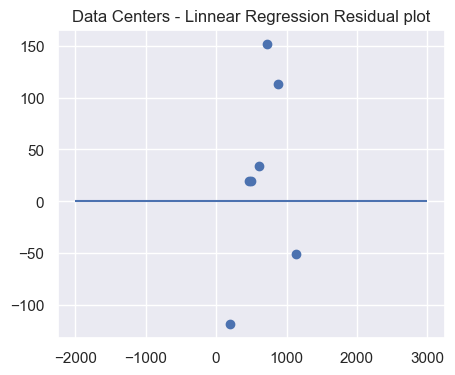

In [188]:
#residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test, (y_preds_test - y_test), c='b')
plt.hlines(y=0, xmin= -2000, xmax=3000)
plt.title('Data Centers - Linnear Regression Residual plot')

In [189]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=['Data Centres Value'], verbose=True, mode='regression')

### 4.5.1. LIME Interpration LR

In [190]:
i = 2
exp = explainer.explain_instance(X_test[i], lrm.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 717.0380443523627
Prediction_local [557.5435739]
Right: 467.9259598435185


[('-1.02 < Quarter <= 0.17', -137.49830038975242),
 ('All Metered Customers <= -0.71', -21.996170060843813)]

**Discussion**

-The predicted value of the Data Centres value is 467.93.

-Both features, Quarter and All metered customeres have a negative influence in the prediciton of the target value.

-All the values are in gigawatts per hour.

### 4.5.2. Cross Validation K-fold CV - LR

In [191]:
# k-fold CV
lrm = LinearRegression()
scores = cross_val_score(lrm, X_train, y_train, scoring='r2', cv=5)
print(scores)
print("Avg :",np.average(scores))

[0.69904829 0.88458178 0.86949582 0.93787655 0.37613447]
Avg : 0.7534273825500379


### 4.6. Ridge Regression

In [192]:
# Using GridSearch for parameter optimization
ridgeregr = GridSearchCV(Ridge(),
                    param_grid={
                        'alpha': [0.1, 0.01] #0.001, 0.1, 1.0, 10  0.1,0.01 # 0.1, 0.01
                    }, verbose=1)

ridgeregr.fit(X_train, y_train)

ridge = ridgeregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [193]:
# Making predictions here
y_preds_train = ridge.predict(X_train)
y_preds_test_ridge = ridge.predict(X_test)

print("R-squared of the model in training set is: {}".format(ridge.score(X_train, y_train)))#0.8981
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(ridge.score(X_test, y_test)))#0.8915
print("Root mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test_ridge)**(1/2)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_ridge) / y_test)) * 100))

R-squared of the model in training set is: 0.8981757018232747
-----Test set statistics-----
R-squared of the model in test set is: 0.891529988098615
Root mean squared error of the prediction is: 87.66301221687337
Mean absolute percentage error of the prediction is: 13.809806285492709


In [194]:
# Display the r2 score values
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.90
Test set score: 0.89


In [195]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test_ridge.reshape(len(y_preds_test_ridge),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   489.698214   470.0
1   873.059049   763.0
2   466.280539   448.0
3   196.922530   315.0
4   729.142351   576.0
5   603.536138   571.0
6  1140.950371  1191.0


Text(0.5, 1.0, 'Data Centres - Ridge Regression Residual plot')

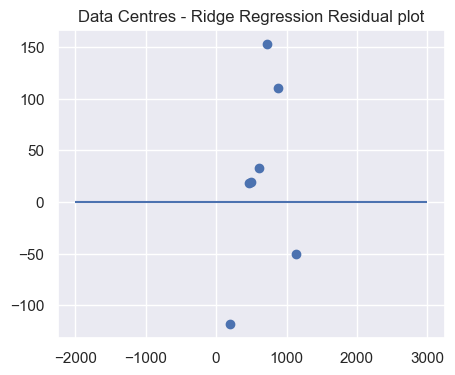

In [196]:
#Ridge Reegression residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test_ridge, (y_preds_test_ridge - y_test), c='b')
plt.hlines(y=0, xmin= -2000, xmax=3000)
plt.title('Data Centres - Ridge Regression Residual plot')

### 4.6.1. LIME Interpretation RR

In [197]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=['Data Centres Value'], verbose=True, mode='regression')

In [198]:
i = 2
exp = explainer.explain_instance(X_test[i], ridgeregr.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 721.8799859531388
Prediction_local [564.49044628]
Right: 466.28053933794956


[('-1.02 < Quarter <= 0.17', -148.14575467709517),
 ('All Metered Customers <= -0.71', -9.243784993697417)]

**Discussion**

-The predicted value of the Data Centres value is 466.28.

-Likewise in LR, both features, Quarter and All metered customeres have a negative influence in the prediciton of the target value. 

-All the values are in gigawatts per hour.

### 4.7. Lasso Regression

In [199]:
# using GridSearch for parameter optimization
lassoregr = GridSearchCV(Lasso(),
                    param_grid={
                        'alpha': [0.1, 0.01] #0.001, 0.1, 1.0, 10.  0.1,0.01

                    }, verbose=1)

lassoregr.fit(X_train, y_train)

lasso = lassoregr.best_estimator_

Fitting 5 folds for each of 2 candidates, totalling 10 fits


In [200]:
# We are making predictions here
y_preds_train = lasso.predict(X_train)
y_preds_test_lasso = lasso.predict(X_test)

print("R-squared of the model in training set is: {}".format(lasso.score(X_train, y_train)))#0.8971
print("-----Test set statistics-----")
print("R-squared of the model in test set is: {}".format(lasso.score(X_test, y_test)))#0.8938
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test_lasso)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test_lasso) / y_test)) * 100))

R-squared of the model in training set is: 0.8982033859639359
-----Test set statistics-----
R-squared of the model in test set is: 0.8906039938144988
Root mean squared error of the prediction is: 88.03640084450531
Mean absolute percentage error of the prediction is: 13.921879893703526


In [201]:
from sklearn.metrics import r2_score
print("Training set score: {:.2f}".format(ridge.score(X_train, y_train)))#0.99
print("Test set score: {:.2f}".format(ridge.score(X_test, y_test)))#0.98

Training set score: 0.90
Test set score: 0.89


In [202]:
# Printing the predicted values and actual values
results = np.concatenate((y_preds_test_lasso.reshape(len(y_preds_test_lasso),1), y_test.reshape(len(y_test),1)),1)
print(pd.DataFrame(results, columns=['Predicted', 'Actual']))

     Predicted  Actual
0   489.389400   470.0
1   876.264290   763.0
2   468.086427   448.0
3   197.394819   315.0
4   727.667312   576.0
5   605.443933   571.0
6  1139.772019  1191.0


Text(0.5, 1.0, 'Data Centres - Lasso Regression Residual plot')

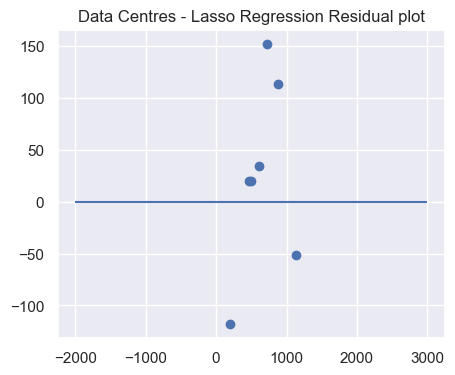

In [203]:
#Lasso Reegression residual plot
fig, ax = plt.subplots(figsize=(5,4)) 
x_plot = plt.scatter(y_preds_test_lasso, (y_preds_test_lasso - y_test), c='b')
plt.hlines(y=0, xmin= -2000, xmax=3000)
plt.title('Data Centres - Lasso Regression Residual plot')

### 4.7.1. LIME Interpretation LAR

In [204]:
#explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=['Data Centres Value'], verbose=True, mode='regression')

In [205]:
i = 2
exp = explainer.explain_instance(X_test[i], lassoregr.predict, num_features=2)
exp.show_in_notebook(show_table=True)
exp.as_list()

Intercept 712.4589974271008
Prediction_local [565.96700582]
Right: 468.0864266902405


[('-1.02 < Quarter <= 0.17', -142.72046136480947),
 ('All Metered Customers <= -0.71', -3.771530242939663)]

**Discussion**

-The predicted value of the Data Centres value is 468.09.

-Likewise in LR and RD, both features, Quarter and All metered customeres have a negative influence in the prediciton of the target value.

-All the values are in gigawatts per hour.

### Final discussion after comparing metrics

**Discussion:** Through the application of the 5 ML models, it was possible to predict the Data Centres target variable. GBR provides a remarkable performance, producing a R² score of **0.9912** and **0.9818** in the training and testing set, also with the lowest RMSE 35.90 and MAPE of 5.39, showing a good balance between training and test data performance. GBR also established that is more robust and reliability across different data subsets with a CV average score of 0.9469, followed after RFR with a score of 0.9227. RFR yield R² score of 0.9913 and 0.9632 in the training and testing set. Thus, Ensemble learner models for regression handling linear data demonstrated their predictive accuracy and generalizing capability in a new data sample

### 4.8. Linear Regression Plot visualization

It was ploted a LR plot to establish the linear relation of the dataset, which was important for the decisions for data models chosen above.

In [206]:
# Method or Function for Linear Regression plot
def lin_regplot(X, y, model):
    plt.scatter(X, y, c = 'blue')
    plt.plot(X, model.predict(X), color = 'red', linewidth = 2)    
    return

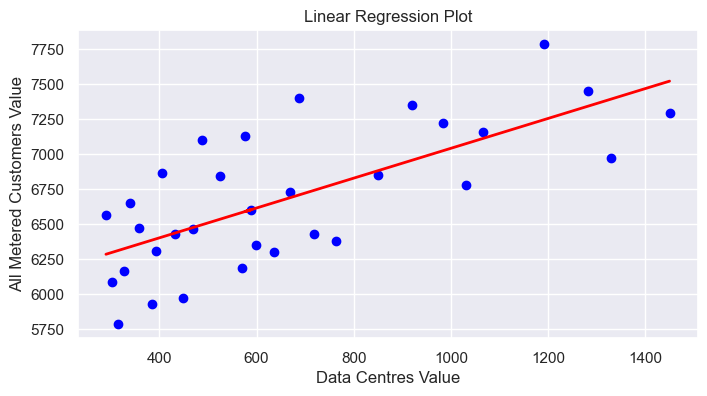

In [207]:
# Store the feature or attribute values in X and y
X = Data_Centres_new[['Data Centres Value']].values
y = Data_Centres_new[['All Metered Customers']].values

lrm.fit(X, y)

# Return a copy of the array collapsed into one dimension.
fig, ax = plt.subplots(figsize=(8,4)) 
sort_idx = X.flatten().argsort()

lin_regplot(X, y, lrm)
plt.title('Linear Regression Plot')
plt.xlabel('Data Centres Value')
plt.ylabel('All Metered Customers Value')
#plt.savefig('./figures/tree_regression.png', dpi = 300)
plt.show()

**References:**

https://data.cso.ie/table/MEC02 

https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html

https://towardsdatascience.com/how-to-use-residual-plots-for-regression-model-validation-c3c70e8ab378

https://www.statology.org/how-to-calculate-residuals-in-regression-analysis/

https://www.geeksforgeeks.org/how-to-create-a-residual-plot-in-python/

https://towardsdatascience.com/how-to-use-residual-plots-for-regression-model-validation-c3c70e8ab378

https://www.cso.ie/en/releasesandpublications/ep/p-dcmec/datacentresmeteredelectricityconsumption2022/keyfindings/#:~:text=Electricity%20consumption%20by%20data%20centres%20increased%20by%2031%25%20between%202021,2015%20to%2018%25%20in%202022.

https://marcotcr.github.io/lime/tutorials/Using%2Blime%2Bfor%2Bregression.html

https://vitalflux.com/lime-machine-learning-python-example/

https://www.corkcity.ie/en/doing-business-in-cork/economic-profile/economic-monitor/ 